In [25]:
#Importing Needed Packages
import datetime
from datetime import datetime, timedelta

import matplotlib.pyplot as plt
from matplotlib.colors import BoundaryNorm
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

from dynamicserialize.dstypes.com.raytheon.uf.common.time import TimeRange

import cartopy.crs as ccrs
import cartopy.feature as cfeature

import pandas as pd
import numpy as np
import xarray as xr

import pprint

from awips.dataaccess import DataAccessLayer
from siphon.catalog import TDSCatalog

import metpy
from metpy.calc import wind_components, get_wind_components
from metpy.cbook import get_test_data
from metpy.plots.wx_symbols import sky_cover, current_weather
from metpy.plots import StationPlot, StationPlotLayout, simple_layout
from metpy.plots import USCOUNTIES
from metpy.interpolate import interpolate_to_grid, remove_nan_observations
from metpy.units import units

import pyart

import warnings 

warnings.filterwarnings('ignore')

%config InlineBackend.figure_format='retina'



#Get Current Time
end = datetime.utcnow()
start = end - timedelta(hours=1)
print(end)

2019-11-25 16:48:26.090978


In [26]:
nexrad = TDSCatalog('http://thredds.ucar.edu/thredds/catalog/grib/nexrad/composite/unidata/catalog.xml')
ncss = nexrad.datasets[0].subset()

query = ncss.query()
query.time_range(start,end).accept('netcdf4').variables('all')
data = ncss.get_data(query)

dataset = xr.open_dataset(xr.backends.NetCDF4DataStore(data))
dat = dataset.metpy.parse_cf()

data_crs = dat['Base_reflectivity_surface_layer'].metpy.cartopy_crs

time = dat['Base_reflectivity_surface_layer'].metpy.time
valid = datetime.strptime(str(time[-1].values)[0:16],'%Y-%m-%dT%H:%M')

x = dat['Base_reflectivity_surface_layer'].metpy.x
y = dat['Base_reflectivity_surface_layer'].metpy.y

ref = dat['Base_reflectivity_surface_layer'][-1,:,:]

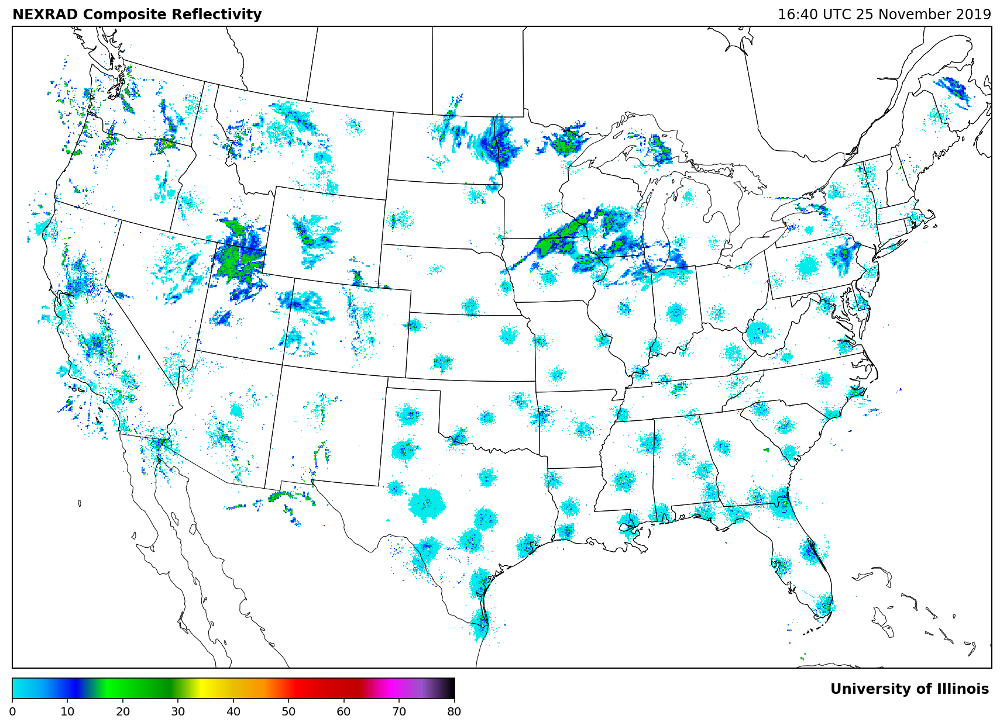

In [27]:
fig = plt.figure(figsize=(15, 12))

proj = ccrs.LambertConformal()
ax = fig.add_subplot(1, 1, 1, projection=proj)

ax.set_extent([x.min(),x.max(),y.min(),y.max()], crs=data_crs)

cs = ax.imshow(ref, cmap = 'pyart_NWSRef',  origin='lower', extent=(x.min(), x.max(), y.min(), y.max()), transform=data_crs, interpolation='none', vmin = 0, vmax = 80)

ax.coastlines(resolution='50m', color='black', linewidth=0.5)
states_provinces = cfeature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces_lakes', scale='50m', facecolor='none')
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.5)

plt.title('NEXRAD Composite Reflectivity', loc='left', fontweight='bold')
plt.title(datetime.strftime(valid, '%H:%M UTC %d %B %Y'), loc='right')

cbaxes = fig.add_axes([.125, .155, 0.35, 0.02]) #[left, bottom, width, height]
plt.colorbar(cs, orientation='horizontal', pad = .01, fraction = .025, cax = cbaxes)

txt = 'University of Illinois'
plt.figtext(.835, 0.16, txt, wrap=True, horizontalalignment='center', fontsize=12, fontweight='bold')

plt.show()

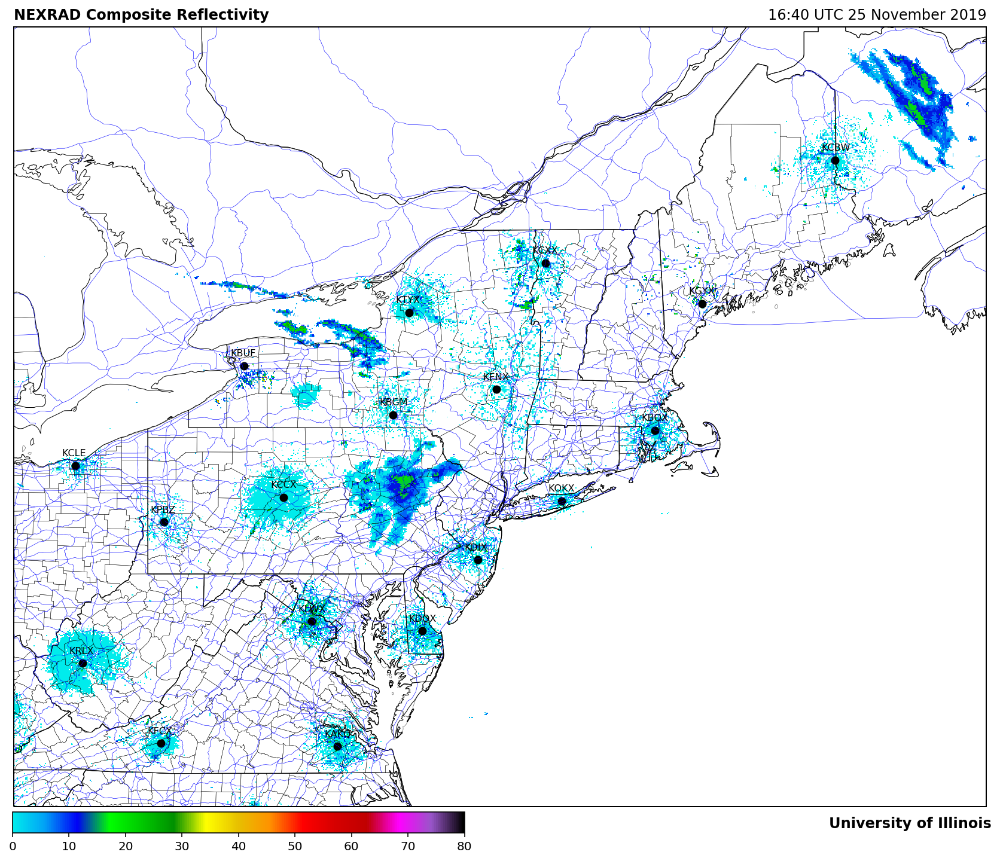

In [28]:
locs = pyart.io.nexrad_common.NEXRAD_LOCATIONS



fig = plt.figure(figsize=(15, 12))

proj = ccrs.Miller()
ax = fig.add_subplot(1, 1, 1, projection=proj)

extent = [-83, -65, 36, 48]
ax.set_extent(extent, crs=ccrs.PlateCarree())

cs = ax.imshow(ref, origin='lower', extent=(x.min(), x.max(), y.min(), y.max()), transform=data_crs, interpolation='none', cmap = 'pyart_NWSRef', vmin = 0, vmax = 80)

ax.coastlines(resolution='10m', color='black', linewidth=0.5)

states_provinces = cfeature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces_lakes', scale='10m', facecolor='none')
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.5)
ax.add_feature(USCOUNTIES.with_scale('5m'), edgecolor='black', linewidth=0.2)
roads = cfeature.NaturalEarthFeature(category='cultural',name='roads',scale='10m', facecolor='none')
ax.add_feature(roads, edgecolor='blue', linewidth=0.3)

plt.title('NEXRAD Composite Reflectivity', loc='left', fontweight='bold')
plt.title(datetime.strftime(valid, '%H:%M UTC %d %B %Y'), loc='right')

cbaxes = fig.add_axes([.135, .1, 0.35, 0.02]) #[left, bottom, width, height]
plt.colorbar(cs, orientation='horizontal', pad = .01, fraction = .025, cax = cbaxes)


for key in locs:
    lon = locs[key]['lon']
    lat = locs[key]['lat']
    
    name = key
    
    ax.scatter(lon,lat,marker='o', color='black', transform=ccrs.PlateCarree())
    
    lat_mod = lat + .15
    lon_mod = lon - .25

    if lon >= extent[0] and lon <= extent[1] and lat >= extent[2] and lat <= extent[3]:
        ax.text(lon_mod, lat_mod, name, color='black', fontsize=8, transform=ccrs.PlateCarree())

txt = 'University of Illinois'
plt.figtext(.83, 0.105, txt, wrap=True, horizontalalignment='center', fontsize=12, fontweight='bold')

plt.show()

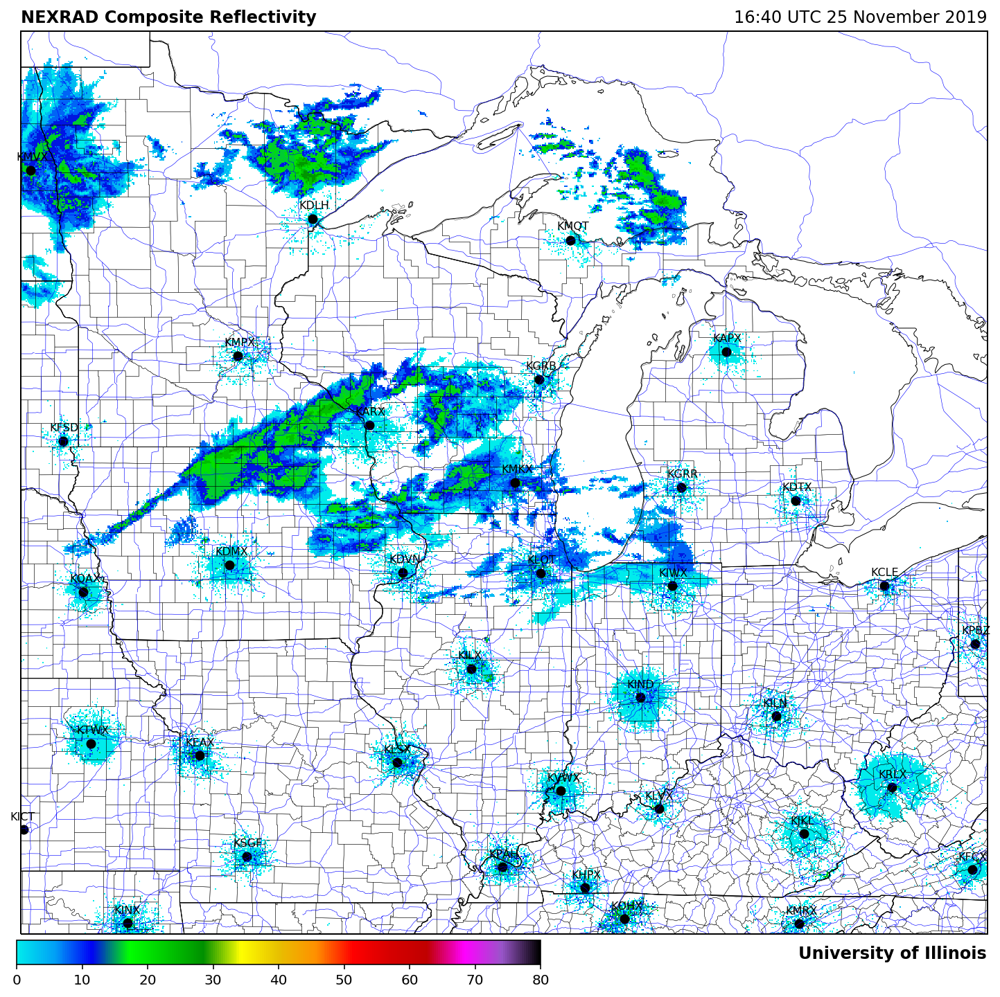

In [29]:
fig = plt.figure(figsize=(15, 12))

proj = ccrs.Miller()
ax = fig.add_subplot(1, 1, 1, projection=proj)

extent = [-97.5, -80, 36, 49.5]
ax.set_extent(extent, crs=ccrs.PlateCarree())

cs = ax.imshow(ref, origin='lower', extent=(x.min(), x.max(), y.min(), y.max()), transform=data_crs, interpolation='none', cmap = 'pyart_NWSRef', vmin = 0, vmax = 80)

ax.coastlines(resolution='10m', color='black', linewidth=0.5)

states_provinces = cfeature.NaturalEarthFeature(category='cultural',name='admin_1_states_provinces_lakes', scale='10m',facecolor='none')
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.5)
ax.add_feature(USCOUNTIES.with_scale('5m'), edgecolor='black', linewidth=0.2)
roads = cfeature.NaturalEarthFeature(category='cultural', name='roads', scale='10m', facecolor='none')
ax.add_feature(roads, edgecolor='blue', linewidth=0.3)

plt.title('NEXRAD Composite Reflectivity', loc='left', fontweight='bold')
plt.title(datetime.strftime(valid, '%H:%M UTC %d %B %Y'), loc='right')

cbaxes = fig.add_axes([.187, .1, 0.35, 0.02]) #[left, bottom, width, height]
plt.colorbar(cs, orientation='horizontal', pad = .01, fraction = .025, cax = cbaxes)


for key in locs:
    lon = locs[key]['lon']
    lat = locs[key]['lat']
    
    name = key
    
    ax.scatter(lon,lat,marker='o', color='black', transform=ccrs.PlateCarree())
    
    lat_mod = lat + .15
    lon_mod = lon - .25

    if lon >= extent[0] and lon <= extent[1] and lat >= extent[2] and lat <= extent[3]:
        ax.text(lon_mod, lat_mod, name, color='black', fontsize=8, transform=ccrs.PlateCarree())

txt = 'University of Illinois'
plt.figtext(.772, 0.105, txt, wrap=True, horizontalalignment='center', fontsize=12, fontweight='bold')

plt.show()

In [30]:
def get_cloud_cover(code):
    if 'OVC' in code:
        return 1.0
    elif 'BKN' in code:
        return 6.0/8.0
    elif 'SCT' in code:
        return 4.0/8.0
    elif 'FEW' in code:
        return 2.0/8.0
    else:
        return 0
    
    
def plot_maxmin_points(lon, lat, data, extrema, nsize, symbol, color='k', plotValue=True, transform=None):

    from scipy.ndimage.filters import maximum_filter, minimum_filter

    if (extrema == 'max'):
        data_ext = maximum_filter(data, nsize, mode='nearest')
    elif (extrema == 'min'):
        data_ext = minimum_filter(data, nsize, mode='nearest')
    else:
        raise ValueError('Value for hilo must be either max or min')

    mxy, mxx = np.where(data_ext == data)

    for i in range(len(mxy)):
        ax.text(lon[mxy[i], mxx[i]], lat[mxy[i], mxx[i]], symbol, color=color, size=24,
                clip_on=True, horizontalalignment='center', verticalalignment='center',
                transform=transform)
        ax.text(lon[mxy[i], mxx[i]], lat[mxy[i], mxx[i]],
                '\n' + str(np.int(data[mxy[i], mxx[i]])),
                color=color, size=12, clip_on=True, fontweight='bold',
                horizontalalignment='center', verticalalignment='top', transform=transform)


In [31]:
#Reading in List of All ASOS Stations in US.
asos_station_list = pd.read_csv('/data/keeling/a/tzaremb2/ASOS Stations US.csv')
station_names = asos_station_list['stid'].values.astype('str').tolist()
station_names =["K" + name for name in station_names]

station_lats = asos_station_list['lat']
station_lons = asos_station_list['lon']

single_value_params = ["timeObs", "stationName", "longitude", "latitude", "temperature", "dewpoint", "windDir", "windSpeed", "seaLevelPress"]
multi_value_params = ["presWeather", "skyCover", "skyLayerBase"]
all_params = single_value_params + multi_value_params
obs_dict = dict({all_params: [] for all_params in all_params})
pres_weather = []
sky_cov = []
sky_layer_base = []


lastHourDateTime = datetime.utcnow() - timedelta(hours = 1)
start = lastHourDateTime.strftime('%Y-%m-%d %H')
beginRange = datetime.strptime( start + ":00:00", "%Y-%m-%d %H:%M:%S")
endRange = datetime.strptime( start + ":59:59", "%Y-%m-%d %H:%M:%S")
timerange = TimeRange(beginRange, endRange)


DataAccessLayer.changeEDEXHost("edex-cloud.unidata.ucar.edu")
request = DataAccessLayer.newDataRequest()
request.setDatatype("obs")
request.setParameters(*(all_params))
request.setLocationNames(*(station_names))

response = DataAccessLayer.getGeometryData(request,timerange)


for ob in response:
    avail_params = ob.getParameters()
    if "presWeather" in avail_params:
        pres_weather.append(ob.getString("presWeather"))
    elif "skyCover" in avail_params and "skyLayerBase" in avail_params:
        sky_cov.append(ob.getString("skyCover"))
        sky_layer_base.append(ob.getNumber("skyLayerBase"))
    else:
        for param in single_value_params:
            if param in avail_params:
                if param == 'timeObs':
                    obs_dict[param].append(datetime.fromtimestamp(ob.getNumber(param)/1000.0))
                else:
                    try:
                        obs_dict[param].append(ob.getNumber(param))
                    except TypeError:
                        obs_dict[param].append(ob.getString(param))
            else:
                obs_dict[param].append(None)

        obs_dict['presWeather'].append(pres_weather);
        obs_dict['skyCover'].append(sky_cov);
        obs_dict['skyLayerBase'].append(sky_layer_base);
        pres_weather = []
        sky_cov = []
        sky_layer_base = []

In [32]:
df = pd.DataFrame(data=obs_dict, columns=all_params)
df = df.sort_values(by='timeObs', ascending=False)

groups = df.groupby('stationName')
df_recent = pd.DataFrame(columns=all_params)

for rid, station in groups:
    row = station.head(1)
    df_recent = pd.concat([df_recent, row])
    
data = dict()
data['stid'] = np.array(df_recent["stationName"])
data['latitude']  = np.array(df_recent['latitude'])
data['longitude'] = np.array(df_recent['longitude'])
data['air_temperature'] = np.array(df_recent['temperature'], dtype=float)* units.degC
data['dew_point'] = np.array(df_recent['dewpoint'], dtype=float)* units.degC
data['slp'] = np.array(df_recent['seaLevelPress'])* units('mbar')

u, v = get_wind_components(np.array(df_recent['windSpeed']) * units('knots'), np.array(df_recent['windDir']) * units.degree)
data['eastward_wind'], data['northward_wind'] = u, v
data['cloud_frac'] = [int(get_cloud_cover(x)*8) for x in df_recent['skyCover']]

In [33]:
new_df = pd.DataFrame()
new_df['stid'] = data['stid']
new_df['latitude'] = data['latitude']
new_df['longitude'] = data['longitude']
new_df['temp'] = data['air_temperature']
new_df['dewpoint'] = data['dew_point']
new_df['slp'] = data['slp']
new_df['east_wind'] = data['eastward_wind'] 
new_df['north_wind'] = data['northward_wind']
new_df['cloud_frac'] = data['cloud_frac']

new_df['slp'] = new_df['slp'].replace(-9999.000000, np.nan)

index_ew = np.where(new_df['east_wind'].values > 1000)[0]
new_df['east_wind'].values[index_ew] = np.nan

index_nw = np.where(new_df['north_wind'].values > 1000)[0]
new_df['north_wind'].values[index_nw] = np.nan

new_df = new_df.dropna()

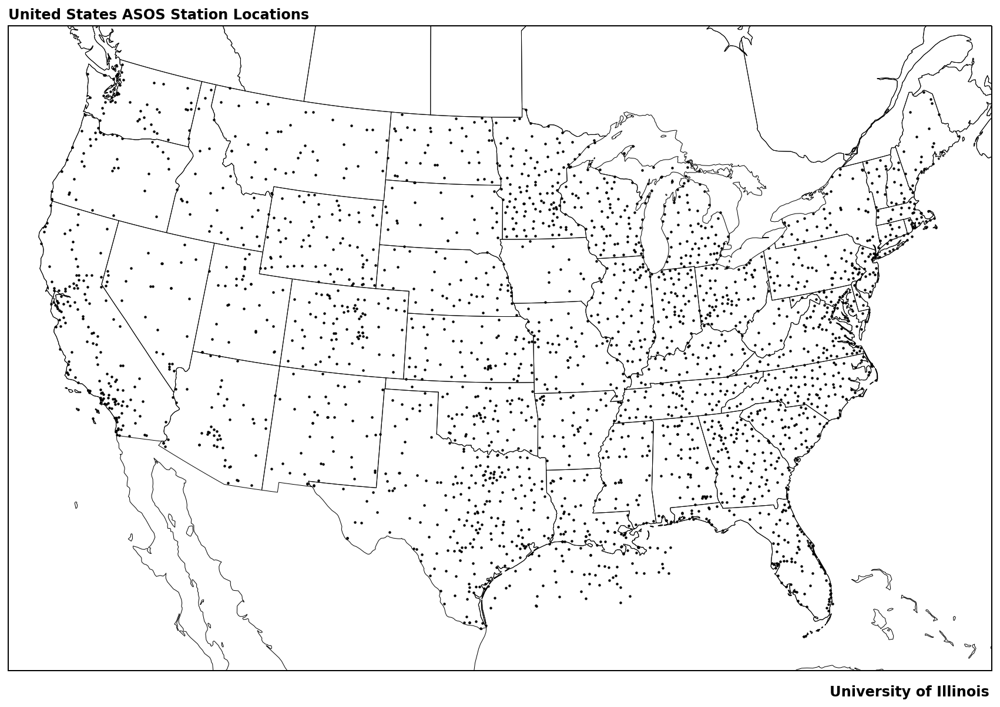

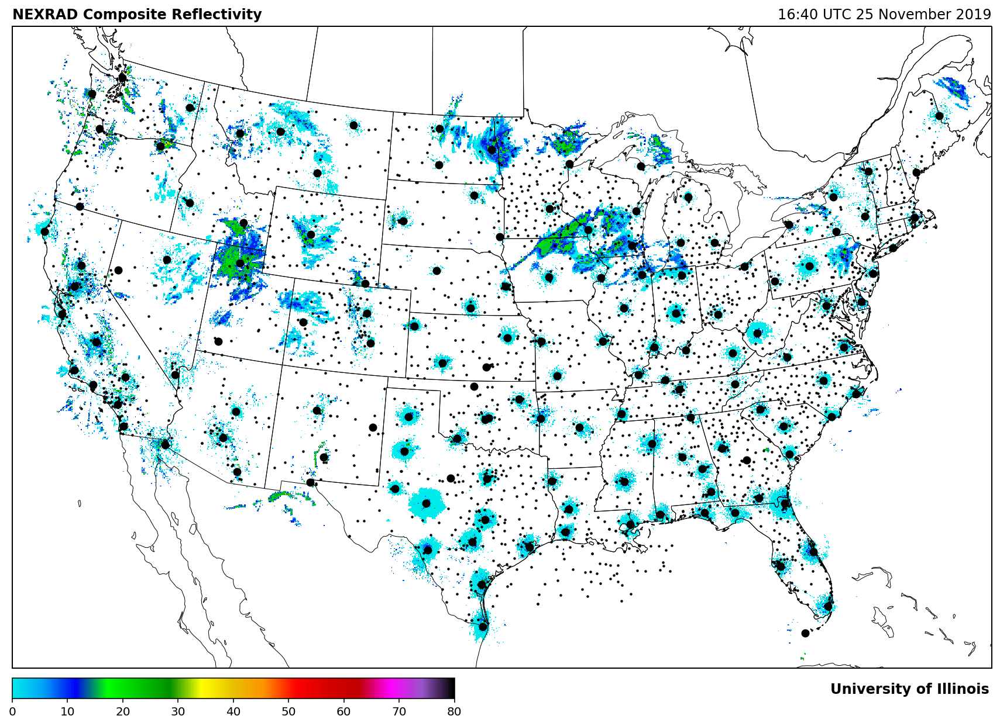

In [34]:
fig = plt.figure(figsize=(15, 12))

proj = ccrs.LambertConformal()
ax = fig.add_subplot(1, 1, 1, projection=proj)

ax.set_extent([x.min(),x.max(),y.min(),y.max()], crs=data_crs)

ax.scatter(station_lons, station_lats, marker='o', color='black', transform=ccrs.PlateCarree(), s = 1.5)

ax.coastlines(resolution='50m', color='black', linewidth=0.5)
states_provinces = cfeature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces_lakes', scale='50m', facecolor='none')
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.5)

plt.title('United States ASOS Station Locations', loc='left', fontweight='bold')

txt = 'University of Illinois'
plt.figtext(.835, 0.16, txt, wrap=True, horizontalalignment='center', fontsize=12, fontweight='bold')

plt.show()



fig = plt.figure(figsize=(15, 12))

proj = ccrs.LambertConformal()
ax = fig.add_subplot(1, 1, 1, projection=proj)

ax.set_extent([x.min(),x.max(),y.min(),y.max()], crs=data_crs)

ax.scatter(station_lons, station_lats, marker='o', color='black', transform=ccrs.PlateCarree(), s = 1.5)

cs = ax.imshow(ref, cmap = 'pyart_NWSRef',  origin='lower', extent=(x.min(), x.max(), y.min(), y.max()), transform=data_crs, interpolation='none', vmin = 0, vmax = 80)

ax.coastlines(resolution='50m', color='black', linewidth=0.5)
states_provinces = cfeature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces_lakes', scale='50m', facecolor='none')
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.5)

plt.title('NEXRAD Composite Reflectivity', loc='left', fontweight='bold')
plt.title(datetime.strftime(valid, '%H:%M UTC %d %B %Y'), loc='right')

cbaxes = fig.add_axes([.125, .155, 0.35, 0.02]) #[left, bottom, width, height]
plt.colorbar(cs, orientation='horizontal', pad = .01, fraction = .025, cax = cbaxes)


for key in locs:
    lon = locs[key]['lon']
    lat = locs[key]['lat']
    
    ax.scatter(lon,lat,marker='o', color='black', transform=ccrs.PlateCarree())
    
txt = 'University of Illinois'
plt.figtext(.835, 0.16, txt, wrap=True, horizontalalignment='center', fontsize=12, fontweight='bold')
    
plt.show()

In [35]:
to_proj = ccrs.AlbersEqualArea(central_longitude=-97., central_latitude=38.)


data = new_df

lon = data['longitude'].values
lat = data['latitude'].values
xp, yp, _ = to_proj.transform_points(ccrs.Geodetic(), lon, lat).T

x_masked, y_masked, pres = remove_nan_observations(lon, lat, data['slp'].values)


data['wind_speed'] = metpy.calc.wind_speed(data.east_wind.values * units.meter / units.second, data.north_wind.values * units.meter / units.second)
data['wind_dir'] = metpy.calc.wind_direction(data.east_wind.values * units.meter / units.second, data.north_wind.values * units.meter / units.second)

wind_speed = (data['wind_speed'].values * units('m/s')).to('knots')
wind_dir = data['wind_dir'].values * units.degree

good_indices = np.where((~np.isnan(wind_dir)) & (~np.isnan(wind_speed)))

x_masked = xp[good_indices]
y_masked = yp[good_indices]
wind_speed = wind_speed[good_indices]
wind_dir = wind_dir[good_indices]

u, v = wind_components(wind_speed, wind_dir)

windgridx, windgridy, uwind = interpolate_to_grid(x_masked, y_masked, np.array(u), interp_type='cressman', search_radius=400000, hres=100000)
_, _, vwind = interpolate_to_grid(x_masked, y_masked, np.array(v), interp_type='cressman', search_radius=400000, hres=100000)

In [36]:
slpgridx, slpgridy, slp = interpolate_to_grid(x_masked, y_masked, pres, interp_type='cressman', minimum_neighbors=1, search_radius=400000, hres=100000)

x_masked, y_masked, t = remove_nan_observations(xp, yp, data['temp'].values)
tempx, tempy, temp = interpolate_to_grid(x_masked, y_masked, t, interp_type='cressman', minimum_neighbors=3, search_radius=400000, hres=35000)
temp = np.ma.masked_where(np.isnan(temp), temp)

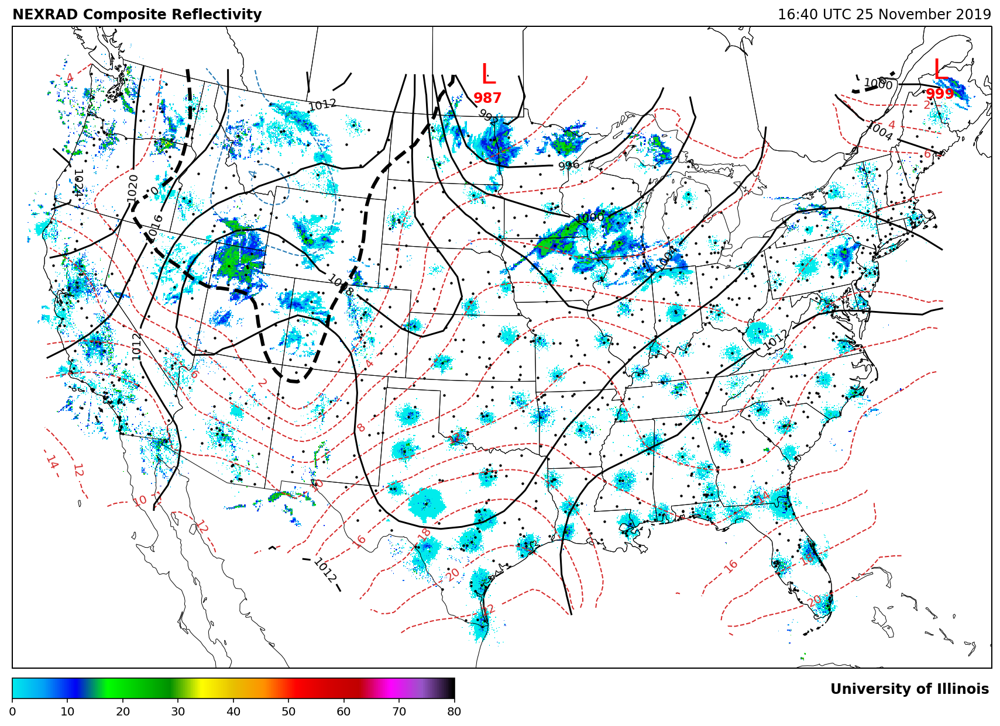

In [37]:
fig = plt.figure(figsize=(15, 12))

proj = ccrs.LambertConformal()
ax = fig.add_subplot(1, 1, 1, projection=proj)

ax.set_extent([x.min(),x.max(),y.min(),y.max()], crs=data_crs)

clevs = (np.arange(-50, -1, 2), np.arange(2, 50, 2))
colors = ('tab:blue', 'tab:red')

for clevthick, color in zip(clevs, colors):
    cs = ax.contour(tempx, tempy, temp, transform=to_proj, levels=clevthick, colors=color, linewidths=1.0, linestyles='dashed')
    plt.clabel(cs, fmt = '%1.f')
    
cs = ax.contour(tempx, tempy, temp, transform=to_proj, levels=[0], colors='black', linewidths=3.0, linestyles='dashed')
plt.clabel(cs, fmt = '%1.f')

P = ax.contour(slpgridx, slpgridy, slp/100, transform=to_proj, colors='k', levels = np.arange(900, 1200, 4))
plt.clabel(P, fmt = '%1.f')

cs = ax.imshow(ref, cmap = 'pyart_NWSRef',  origin='lower', extent=(x.min(), x.max(), y.min(), y.max()), transform=data_crs, interpolation='none', vmin = 0, vmax = 80)

ax.coastlines(resolution='50m', color='black', linewidth=0.5)
states_provinces = cfeature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces_lakes', scale='50m', facecolor='none')
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.5)

plt.title('NEXRAD Composite Reflectivity', loc='left', fontweight='bold')
plt.title(datetime.strftime(valid, '%H:%M UTC %d %B %Y'), loc='right')

cbaxes = fig.add_axes([.125, .155, 0.35, 0.02]) #[left, bottom, width, height]
plt.colorbar(cs, orientation='horizontal', pad = .01, fraction = .025, cax = cbaxes)

plot_maxmin_points(slpgridx, slpgridy, slp/100, 'max', 50, symbol='H', color='b',  transform=to_proj)
plot_maxmin_points(slpgridx, slpgridy, slp/100, 'min', 25, symbol='L', color='r', transform=to_proj)

txt = 'University of Illinois'
plt.figtext(.835, 0.16, txt, wrap=True, horizontalalignment='center', fontsize=12, fontweight='bold')

ax.scatter(new_df['longitude'].values, new_df['latitude'].values,   marker='o', color='black', transform=ccrs.PlateCarree(), s = 1.5)
plt.show()

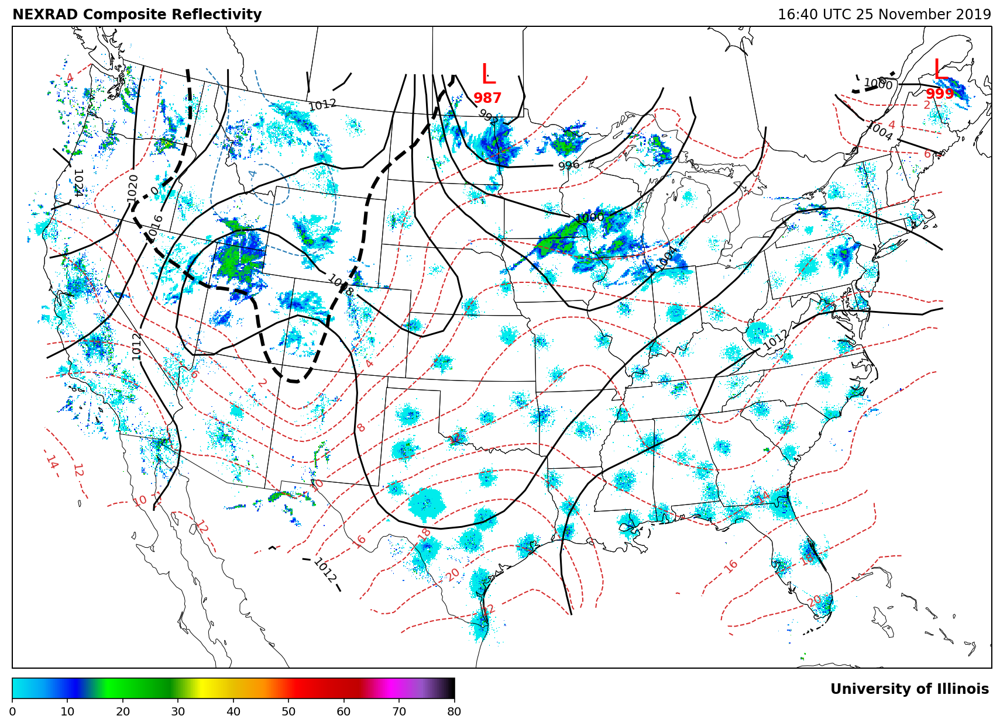

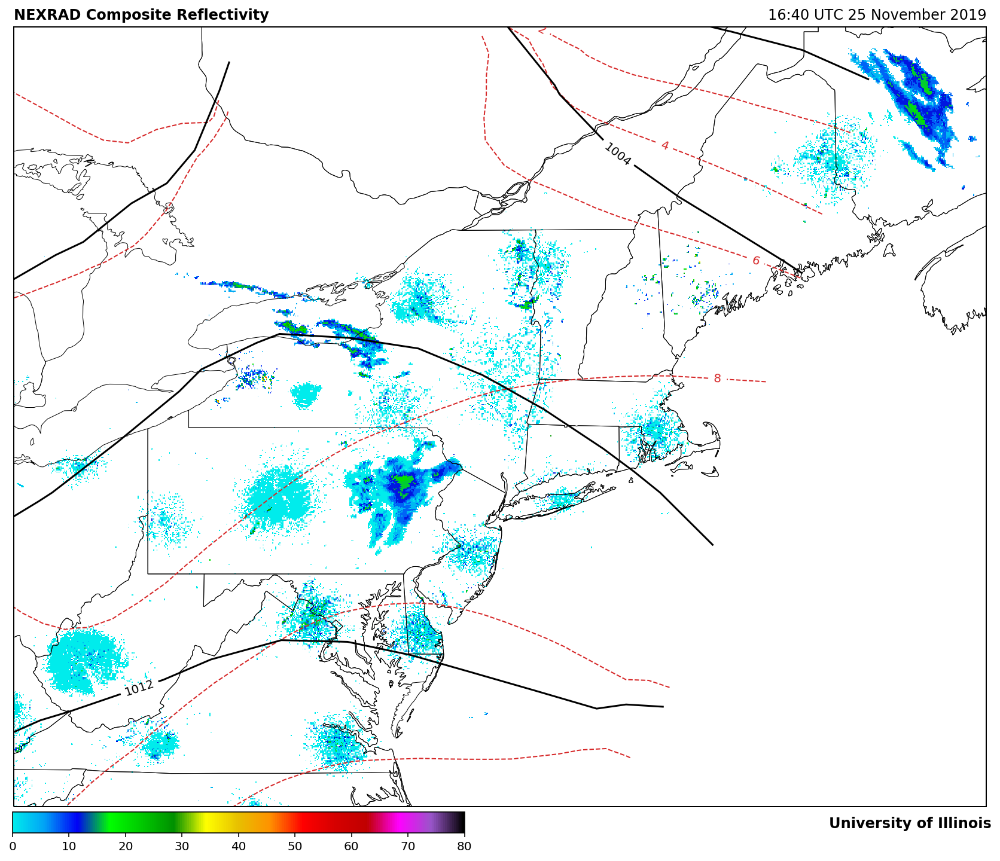

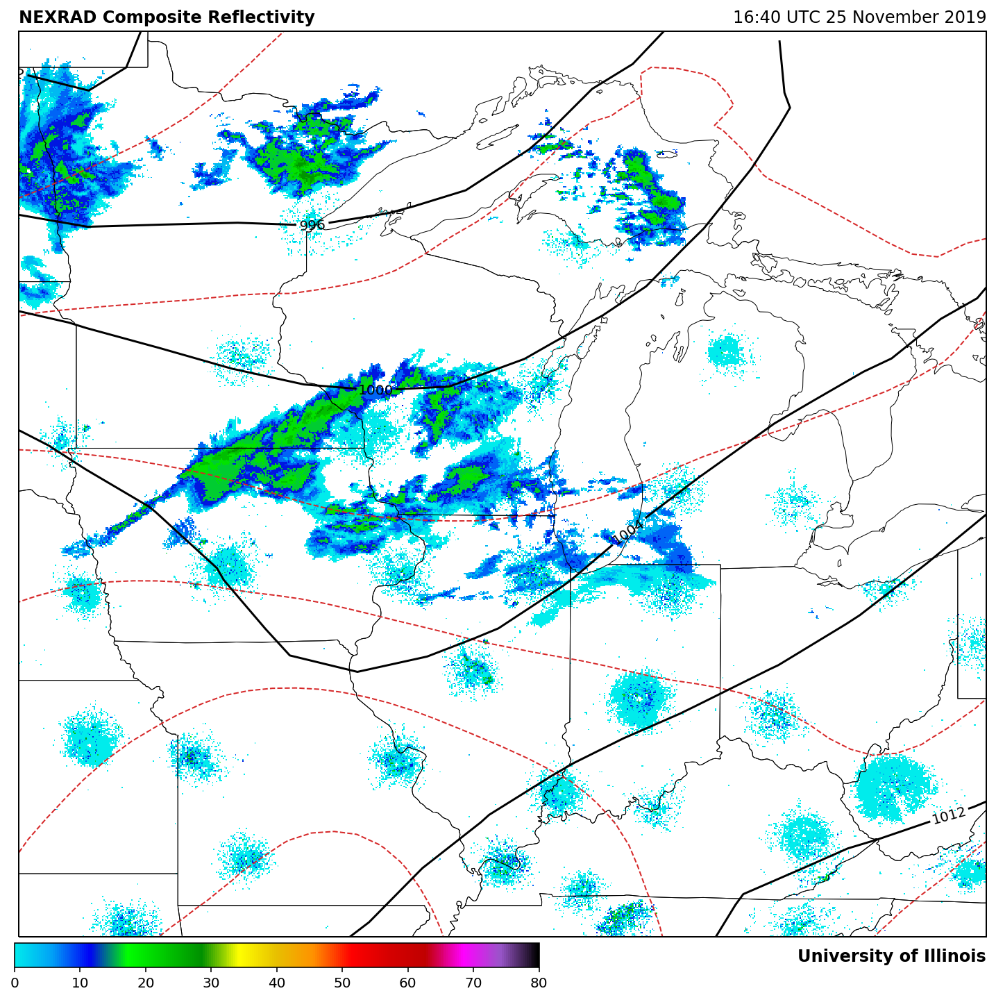

In [38]:
fig = plt.figure(figsize=(15, 12))

proj = ccrs.LambertConformal()
ax = fig.add_subplot(1, 1, 1, projection=proj)

ax.set_extent([x.min(),x.max(),y.min(),y.max()], crs=data_crs)

clevs = (np.arange(-50, -1, 2), np.arange(2, 50, 2))
colors = ('tab:blue', 'tab:red')

for clevthick, color in zip(clevs, colors):
    cs = ax.contour(tempx, tempy, temp, transform=to_proj, levels=clevthick, colors=color, linewidths=1.0, linestyles='dashed')
    plt.clabel(cs, fmt = '%1.f')
    
cs = ax.contour(tempx, tempy, temp, transform=to_proj, levels=[0], colors='black', linewidths=3.0, linestyles='dashed')
plt.clabel(cs, fmt = '%1.f')

P = ax.contour(slpgridx, slpgridy, slp/100, transform=to_proj, colors='k', levels = np.arange(900, 1200, 4))
plt.clabel(P, fmt = '%1.f')

cs = ax.imshow(ref, cmap = 'pyart_NWSRef',  origin='lower', extent=(x.min(), x.max(), y.min(), y.max()), transform=data_crs, interpolation='none', vmin = 0, vmax = 80)

ax.coastlines(resolution='50m', color='black', linewidth=0.5)
states_provinces = cfeature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces_lakes', scale='50m', facecolor='none')
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.5)

plt.title('NEXRAD Composite Reflectivity', loc='left', fontweight='bold')
plt.title(datetime.strftime(valid, '%H:%M UTC %d %B %Y'), loc='right')

cbaxes = fig.add_axes([.125, .155, 0.35, 0.02]) #[left, bottom, width, height]
plt.colorbar(cs, orientation='horizontal', pad = .01, fraction = .025, cax = cbaxes)

plot_maxmin_points(slpgridx, slpgridy, slp/100, 'max', 50, symbol='H', color='b',  transform=to_proj)
plot_maxmin_points(slpgridx, slpgridy, slp/100, 'min', 25, symbol='L', color='r', transform=to_proj)

txt = 'University of Illinois'
plt.figtext(.835, 0.16, txt, wrap=True, horizontalalignment='center', fontsize=12, fontweight='bold')

plt.show()



fig = plt.figure(figsize=(15, 12))

proj = ccrs.Miller()
ax = fig.add_subplot(1, 1, 1, projection=proj)

extent = [-83, -65, 36, 48]
ax.set_extent(extent, crs=ccrs.PlateCarree())

clevs = (np.arange(-50, -1, 2), np.arange(2, 50, 2))
colors = ('tab:blue', 'tab:red')

for clevthick, color in zip(clevs, colors):
    cs = ax.contour(tempx, tempy, temp, transform=to_proj, levels=clevthick, colors=color, linewidths=1.0, linestyles='dashed')
    plt.clabel(cs, fmt = '%1.f')
    
cs = ax.contour(tempx, tempy, temp, transform=to_proj, levels=[0], colors='black', linewidths=3.0, linestyles='dashed')
plt.clabel(cs, fmt = '%1.f')

P = ax.contour(slpgridx, slpgridy, slp/100, transform=to_proj, colors='k', levels = np.arange(900, 1200, 4))
plt.clabel(P, fmt = '%1.f')


cs = ax.imshow(ref, origin='lower', extent=(x.min(), x.max(), y.min(), y.max()), transform=data_crs, interpolation='none', cmap = 'pyart_NWSRef', vmin = 0, vmax = 80)

ax.coastlines(resolution='10m', color='black', linewidth=0.5)

states_provinces = cfeature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces_lakes', scale='10m', facecolor='none')
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.5)

plt.title('NEXRAD Composite Reflectivity', loc='left', fontweight='bold')
plt.title(datetime.strftime(valid, '%H:%M UTC %d %B %Y'), loc='right')

cbaxes = fig.add_axes([.135, .1, 0.35, 0.02]) #[left, bottom, width, height]
plt.colorbar(cs, orientation='horizontal', pad = .01, fraction = .025, cax = cbaxes)

txt = 'University of Illinois'
plt.figtext(.83, 0.105, txt, wrap=True, horizontalalignment='center', fontsize=12, fontweight='bold')

plt.show()



fig = plt.figure(figsize=(15, 12))

proj = ccrs.Miller()
ax = fig.add_subplot(1, 1, 1, projection=proj)

extent = [-97.5, -80, 36, 49.5]
ax.set_extent(extent, crs=ccrs.PlateCarree())

cs = ax.imshow(ref, origin='lower', extent=(x.min(), x.max(), y.min(), y.max()), transform=data_crs, interpolation='none', cmap = 'pyart_NWSRef', vmin = 0, vmax = 80)

ax.coastlines(resolution='10m', color='black', linewidth=0.5)

states_provinces = cfeature.NaturalEarthFeature(category='cultural',name='admin_1_states_provinces_lakes', scale='10m',facecolor='none')
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.5)
roads = cfeature.NaturalEarthFeature(category='cultural', name='roads', scale='10m', facecolor='none')

plt.title('NEXRAD Composite Reflectivity', loc='left', fontweight='bold')
plt.title(datetime.strftime(valid, '%H:%M UTC %d %B %Y'), loc='right')

cbaxes = fig.add_axes([.187, .1, 0.35, 0.02]) #[left, bottom, width, height]
plt.colorbar(cs, orientation='horizontal', pad = .01, fraction = .025, cax = cbaxes)

clevs = (np.arange(-50, -1, 2), np.arange(2, 50, 2))
colors = ('tab:blue', 'tab:red')

for clevthick, color in zip(clevs, colors):
    cs = ax.contour(tempx, tempy, temp, transform=to_proj, levels=clevthick, colors=color, linewidths=1.0, linestyles='dashed')
    plt.clabel(cs, fmt = '%1.f')
    
cs = ax.contour(tempx, tempy, temp, transform=to_proj, levels=[0], colors='black', linewidths=3.0, linestyles='dashed')
plt.clabel(cs, fmt = '%1.f')

P = ax.contour(slpgridx, slpgridy, slp/100, transform=to_proj, colors='k', levels = np.arange(900, 1200, 4))
plt.clabel(P, fmt = '%1.f')

txt = 'University of Illinois'
plt.figtext(.772, 0.105, txt, wrap=True, horizontalalignment='center', fontsize=12, fontweight='bold')

plt.show()

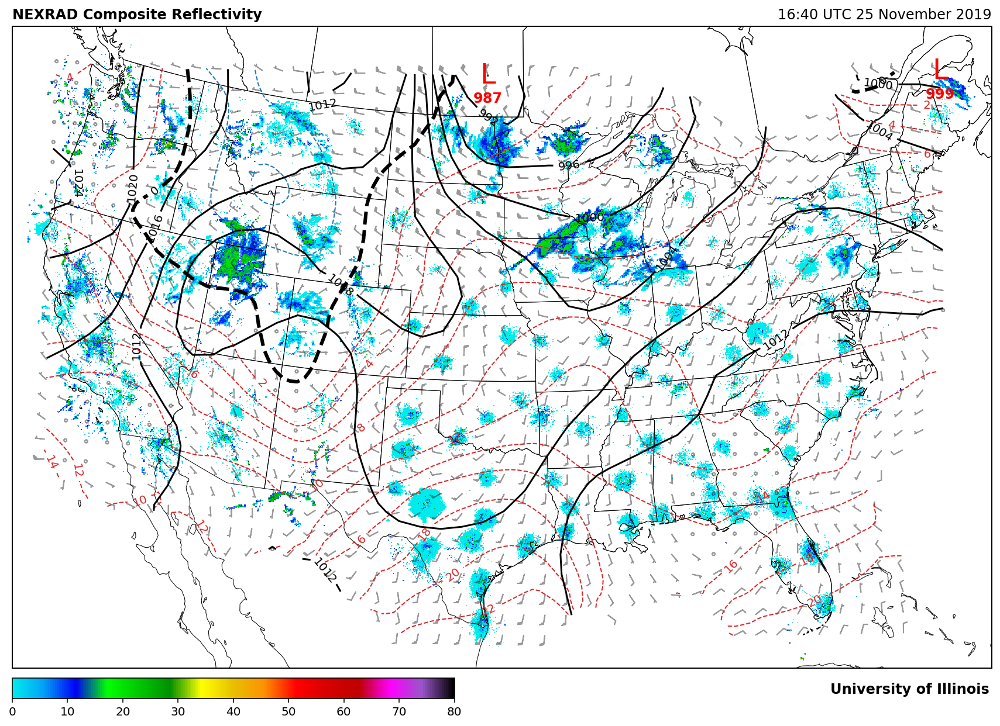

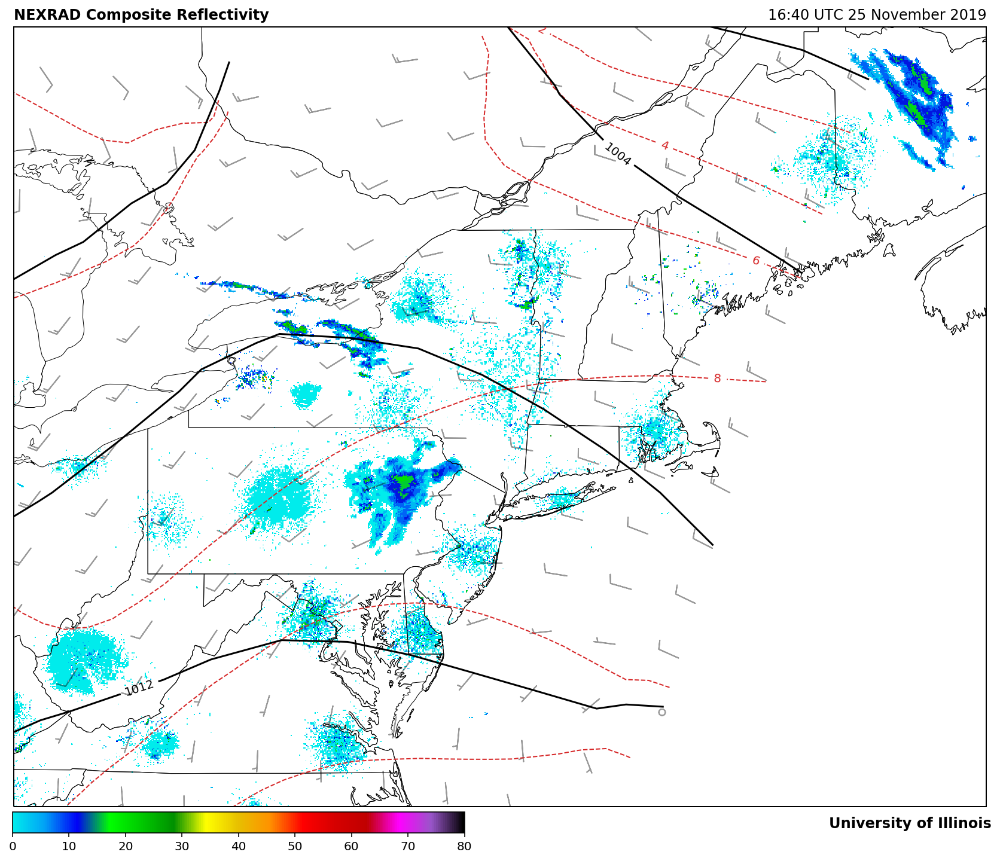

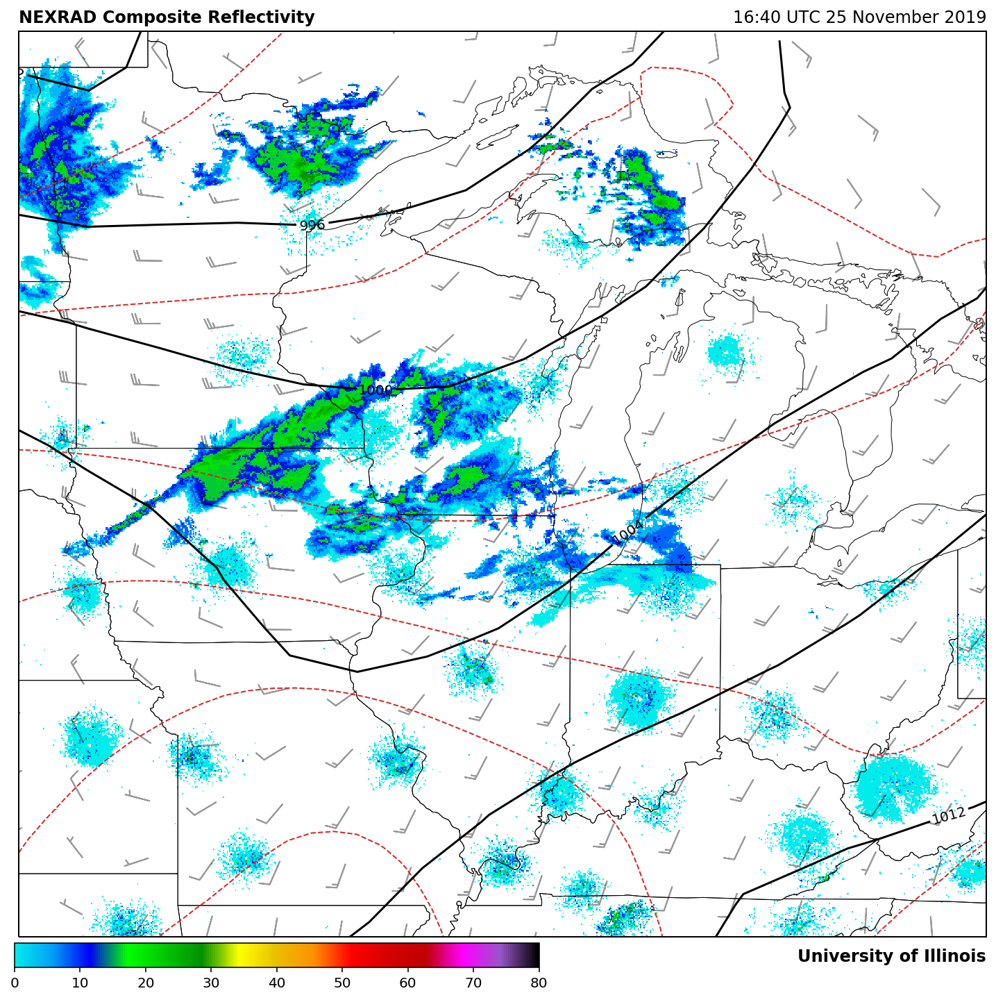

In [40]:
fig = plt.figure(figsize=(15, 12))

proj = ccrs.LambertConformal()
ax = fig.add_subplot(1, 1, 1, projection=proj)

ax.set_extent([x.min(),x.max(),y.min(),y.max()], crs=data_crs)

ax.barbs(windgridx, windgridy, uwind, vwind, alpha=.4, length=4,  transform=to_proj)

clevs = (np.arange(-50, -1, 2), np.arange(2, 50, 2))
colors = ('tab:blue', 'tab:red')

for clevthick, color in zip(clevs, colors):
    cs = ax.contour(tempx, tempy, temp, transform=to_proj, levels=clevthick, colors=color, linewidths=1.0, linestyles='dashed')
    plt.clabel(cs, fmt = '%1.f')
    
cs = ax.contour(tempx, tempy, temp, transform=to_proj, levels=[0], colors='black', linewidths=3.0, linestyles='dashed')
plt.clabel(cs, fmt = '%1.f')

P = ax.contour(slpgridx, slpgridy, slp/100, transform=to_proj, colors='k', levels = np.arange(900, 1200, 4))
plt.clabel(P, fmt = '%1.f')

cs = ax.imshow(ref, cmap = 'pyart_NWSRef',  origin='lower', extent=(x.min(), x.max(), y.min(), y.max()), transform=data_crs, interpolation='none', vmin = 0, vmax = 80)

ax.coastlines(resolution='50m', color='black', linewidth=0.5)
states_provinces = cfeature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces_lakes', scale='50m', facecolor='none')
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.5)

plt.title('NEXRAD Composite Reflectivity', loc='left', fontweight='bold')
plt.title(datetime.strftime(valid, '%H:%M UTC %d %B %Y'), loc='right')

cbaxes = fig.add_axes([.125, .155, 0.35, 0.02]) #[left, bottom, width, height]
plt.colorbar(cs, orientation='horizontal', pad = .01, fraction = .025, cax = cbaxes)

plot_maxmin_points(slpgridx, slpgridy, slp/100, 'max', 50, symbol='H', color='b',  transform=to_proj)
plot_maxmin_points(slpgridx, slpgridy, slp/100, 'min', 25, symbol='L', color='r', transform=to_proj)

txt = 'University of Illinois'
plt.figtext(.835, 0.16, txt, wrap=True, horizontalalignment='center', fontsize=12, fontweight='bold')

plt.show()




fig = plt.figure(figsize=(15, 12))

proj = ccrs.Miller()
ax = fig.add_subplot(1, 1, 1, projection=proj)

extent = [-83, -65, 36, 48]
ax.set_extent(extent, crs=ccrs.PlateCarree())

clevs = (np.arange(-50, -1, 2), np.arange(2, 50, 2))
colors = ('tab:blue', 'tab:red')

for clevthick, color in zip(clevs, colors):
    cs = ax.contour(tempx, tempy, temp, transform=to_proj, levels=clevthick, colors=color, linewidths=1.0, linestyles='dashed')
    plt.clabel(cs, fmt = '%1.f')
    
cs = ax.contour(tempx, tempy, temp, transform=to_proj, levels=[0], colors='black', linewidths=3.0, linestyles='dashed')
plt.clabel(cs, fmt = '%1.f')

P = ax.contour(slpgridx, slpgridy, slp/100, transform=to_proj, colors='k', levels = np.arange(900, 1200, 4))
plt.clabel(P, fmt = '%1.f')

ax.barbs(windgridx, windgridy, uwind, vwind, alpha=.4, length=6,  transform=to_proj)

cs = ax.imshow(ref, origin='lower', extent=(x.min(), x.max(), y.min(), y.max()), transform=data_crs, interpolation='none', cmap = 'pyart_NWSRef', vmin = 0, vmax = 80)

ax.coastlines(resolution='10m', color='black', linewidth=0.5)

states_provinces = cfeature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces_lakes', scale='10m', facecolor='none')
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.5)

plt.title('NEXRAD Composite Reflectivity', loc='left', fontweight='bold')
plt.title(datetime.strftime(valid, '%H:%M UTC %d %B %Y'), loc='right')

cbaxes = fig.add_axes([.135, .1, 0.35, 0.02]) #[left, bottom, width, height]
plt.colorbar(cs, orientation='horizontal', pad = .01, fraction = .025, cax = cbaxes)

txt = 'University of Illinois'
plt.figtext(.83, 0.105, txt, wrap=True, horizontalalignment='center', fontsize=12, fontweight='bold')

plt.show()






fig = plt.figure(figsize=(15, 12))

proj = ccrs.Miller()
ax = fig.add_subplot(1, 1, 1, projection=proj)

extent = [-97.5, -80, 36, 49.5]
ax.set_extent(extent, crs=ccrs.PlateCarree())

cs = ax.imshow(ref, origin='lower', extent=(x.min(), x.max(), y.min(), y.max()), transform=data_crs, interpolation='none', cmap = 'pyart_NWSRef', vmin = 0, vmax = 80)

ax.coastlines(resolution='10m', color='black', linewidth=0.5)

states_provinces = cfeature.NaturalEarthFeature(category='cultural',name='admin_1_states_provinces_lakes', scale='10m',facecolor='none')
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.5)
roads = cfeature.NaturalEarthFeature(category='cultural', name='roads', scale='10m', facecolor='none')

plt.title('NEXRAD Composite Reflectivity', loc='left', fontweight='bold')
plt.title(datetime.strftime(valid, '%H:%M UTC %d %B %Y'), loc='right')

cbaxes = fig.add_axes([.187, .1, 0.35, 0.02]) #[left, bottom, width, height]
plt.colorbar(cs, orientation='horizontal', pad = .01, fraction = .025, cax = cbaxes)

clevs = (np.arange(-50, -1, 2), np.arange(2, 50, 2))
colors = ('tab:blue', 'tab:red')

ax.barbs(windgridx, windgridy, uwind, vwind, alpha=.4, length=6,  transform=to_proj)

for clevthick, color in zip(clevs, colors):
    cs = ax.contour(tempx, tempy, temp, transform=to_proj, levels=clevthick, colors=color, linewidths=1.0, linestyles='dashed')
    plt.clabel(cs, fmt = '%1.f')
    
cs = ax.contour(tempx, tempy, temp, transform=to_proj, levels=[0], colors='black', linewidths=3.0, linestyles='dashed')
plt.clabel(cs, fmt = '%1.f')

P = ax.contour(slpgridx, slpgridy, slp/100, transform=to_proj, colors='k', levels = np.arange(900, 1200, 4))
plt.clabel(P, fmt = '%1.f')

txt = 'University of Illinois'
plt.figtext(.772, 0.105, txt, wrap=True, horizontalalignment='center', fontsize=12, fontweight='bold')

plt.show()